In [148]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sn
import numpy as np

import xgboost as xgb

from scipy.fft import fft, fftfreq
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from sklearn.cluster import OPTICS
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, silhouette_score

In [24]:
class CustomPlotter:

    @staticmethod
    def hist_and_boxplot(df: pd.DataFrame, col: str, ax=None, outlier_drop_pct=0):
        if ax is None:
            fig, (ax_hist, ax_boxplot) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), gridspec_kw={"height_ratios": (.85, .15), "hspace": 0.3})
        else:
            ax_hist, ax_boxplot = ax
        
        # Remove the top n% of data
        n_pct = int((outlier_drop_pct / 100) * len(df))
        
        df_ = df.sort_values(by=col).reset_index()
        df_ = df_.iloc[n_pct:]
        df_ = df_.iloc[:-n_pct]
        
        # Histogram with a vertical line at the mean value
        sn.histplot(data=df_, x=col, kde=False, ax=ax_hist)
        ax_hist.axvline(df_[col].mean(), color='r', linestyle='--', label=f'Mean: {df_[col].mean():.2f}')
        ax_hist.legend()
        ax_hist.set_title(f'Histogram and Boxplot for {col}')
        ax_hist.set_xlabel('')

        # Horizontal boxplot below the histogram
        sn.boxplot(data=df_, x=col, orient='h', ax=ax_boxplot)
        ax_boxplot.set_xlabel('')
        ax_boxplot.set_yticks([])

    @staticmethod
    def top_barplot_cat(df, col, ax=None, top_n_categories=10):
        if ax is None:
            ax = plt.gca()

        category_counts = df[col].value_counts(ascending=False).iloc[:top_n_categories]  # Select the N most frequent categories
        sn.barplot(x=list(category_counts.index), y=category_counts.values, palette='viridis', ax=ax)
        ax.set_title(f'Barplot for {col} (Top {top_n_categories} Ordered by Frequency)')
        ax.set_xlabel(col)
        ax.set_ylabel('Frequency')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)  # Rotate labels to prevent overlap

    @staticmethod
    def num_vs_target(df: pd.DataFrame, col: str, target: str, ax: plt.Axes = None):
        # Create the scatter plot and regression line in the provided Axes object
        if ax is None:
            ax = plt.gca()

        # Create scatter plot with regression line
        sn.scatterplot(data=df, x=col, y=target, alpha=0.7, ax=ax)
        ax.set_title(f"Scatter plot of {col} vs {target}")

        # Calculate and plot the linear regression line
        no_nan_data = df.dropna()
        X = no_nan_data[col].values.reshape(-1, 1)
        Y = no_nan_data[target].values.reshape(-1, 1)
        model = LinearRegression()
        model.fit(X, Y)
        y_pred = model.predict(X)

        y_min = df[target].min()
        y_max = df[target].max()
        y_range = y_max - y_min

        y_min -= y_range * .02
        y_max += y_range * .02

        ax.set_ylim((y_min, y_max))

        ax.plot(X, y_pred, color="red", linestyle="--", label="Linear regression")
        ax.legend()

    @staticmethod
    def cat_vs_target(df: pd.DataFrame, col: str, target: str, ax: plt.Axes = None, log_attrs=[]):
        # Sort categories by mean value
        category_order = df.groupby(col)[target].median().sort_values(ascending=False).index

        # Create boxplot for categorical columns in the provided Axes object
        if ax is None:
            ax = plt.gca()

        boxplot = sn.boxplot(data=df, x=col, y=target, order=category_order, ax=ax)
        ax.set_title(f"Boxplot of {target} by {col}")

        # Tilt category labels and adjust font size
        num_categories = len(category_order)
        
        if col in log_attrs: ax.set_yscale('log')

        fontsize = 8 if num_categories > 10 else 10
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=fontsize, ha="right")

    @staticmethod
    def combined_plots(df, columns, target, figsize=(14, 8), outlier_drop_pct=0, log_attrs=[]):
        sn.set_style('whitegrid')
        for col in columns:
            if col == target:
                continue
            fig = plt.figure(figsize=figsize)
            fig.suptitle(f'Analysis of {col}', fontsize=16)
            gs = fig.add_gridspec(6, 2)

            ax_target = fig.add_subplot(gs[:, 1])

            if pd.api.types.is_numeric_dtype(df[col]):
                ax_hist = fig.add_subplot(gs[:5, 0])
                ax_box = fig.add_subplot(gs[5, 0])
                CustomPlotter.hist_and_boxplot(df, col, ax=(ax_hist, ax_box), outlier_drop_pct=outlier_drop_pct)
                CustomPlotter.num_vs_target(df, col, target, ax=ax_target)
            else:
                ax_bp = fig.add_subplot(gs[:, 0])
                CustomPlotter.top_barplot_cat(df, col, ax=ax_bp, top_n_categories=10)
                CustomPlotter.cat_vs_target(df, col, target, ax=ax_target, log_attrs=log_attrs)
            
            plt.tight_layout()
            plt.show()
    
    @staticmethod
    def plot_histogram_boxplot(data, title, ax_hist, ax_box):
        sn.histplot(data=data, kde=True, ax=ax_hist)
        ax_hist.axvline(data.mean(), color='red', linestyle='--')
        ax_hist.set_title(title + ' Histogram')
        
        sn.boxplot(x=data, orient='h', ax=ax_box)
        ax_box.set_title(title + ' Boxplot')
        ax_box.set_yticks([])

    @staticmethod
    def find_optimal_period(data, min_period, max_period):
        best_period = None
        min_rss = np.inf

        for period in range(min_period, max_period + 1, 15):
            try:
                decomposition = STL(data, period=period).fit()
                residuals = decomposition.resid.dropna()
                rss = np.sum(residuals ** 2)

                if rss < min_rss:
                    min_rss = rss
                    best_period = period
            except ValueError:
                continue

        return best_period

    @staticmethod
    def plot_timeseries_decomposition(data, title, ax):
        min_period = 12
        max_period = 12 * 5 * 51
        optimal_period = CustomPlotter.find_optimal_period(data, min_period, max_period)

        decomposition = STL(data, period=optimal_period).fit()
        trend = decomposition.trend.dropna()
        seasonal = decomposition.seasonal.dropna()
        resid = decomposition.resid.dropna()

        ax[0].plot(data, label='Original')
        ax[0].set_title(title + ' Time Series [%d]' % optimal_period)
        
        ax[1].plot(trend, label='Trend')
        ax[1].set_title(title + ' Trend [%d]' % optimal_period)
        
        ax[2].plot(seasonal, label='Seasonality')
        ax[2].set_title(title + ' Seasonality [%d]' % optimal_period)
        
        ax[3].plot(resid, label='Residuals [%d]' % optimal_period)
        ax[3].set_title(title + ' Residuals')

    @staticmethod
    def plot_fft(data, title, ax):
        N = len(data)
        T = 10 * 60  # 10 minutes in seconds
        yf = fft(data.to_numpy())
        xf = fftfreq(N, T)[:N // 2]

        # Plot the FFT with logarithmic scale and real frequency (in Hz)
        ax.plot(xf, 20 * np.log10(2.0 / N * np.abs(yf[:N // 2])))
        ax.set_title(title + ' Frequency Domain')
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Amplitude (dB)')
    
    @staticmethod
    def time_series_analysis(df, attribute):
        if attribute == 'Date Time':
            return

        data = df[attribute].dropna()

        sn.set(style='whitegrid')
        fig = plt.figure(figsize=(16, 12))
        fig.suptitle(f'Analysis of {attribute}', fontsize=16)
        
        # Create subplots with different heights
        gs = fig.add_gridspec(6, 2)
        ax_hist = fig.add_subplot(gs[:3, 0])
        ax_box = fig.add_subplot(gs[3, 0])
        ax_ts = [fig.add_subplot(gs[i, 1]) for i in range(4)]
        ax_fft = fig.add_subplot(gs[4:, :])

        # Call plotting functions
        CustomPlotter.plot_histogram_boxplot(data, attribute, ax_hist, ax_box)
        CustomPlotter.plot_timeseries_decomposition(data, attribute, ax_ts)
        CustomPlotter.plot_fft(data, attribute, ax_fft)
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    @staticmethod
    def plot_autocorrelation(df, attribute):
        data = df[attribute].dropna()
        
        fig, ax = plt.subplots(figsize=(8, 4))
        autocorrelation_plot(data, ax=ax)
        ax.set_title(f'Autocorrelation of {attribute}')
        plt.show()

    @staticmethod
    def plot_corrmatrix(df, figsize=(12, 10)):
        corr_matrix = df.corr()

        # Set up a Seaborn theme
        sn.set_theme(style="white")

        # Create a correlation matrix plot
        plt.figure(figsize=figsize)
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Create a mask to display only the lower triangle
        cmap = sn.diverging_palette(230, 20, as_cmap=True)  # Generate a custom diverging colormap
        sn.heatmap(corr_matrix, mask=mask, cmap=cmap, center=0, annot=True, fmt=".2f",
                    square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"fontsize": 10})
        plt.title("Correlation Matrix")
        plt.show()

    @staticmethod
    def autocorrelation_analysis(df):
        for attribute in df.columns:
            CustomPlotter.plot_autocorrelation(df, attribute)


In [184]:
df = pd.read_csv('../datasets/data_project_vgm.csv').drop(columns=['diff12', 's12', 's', 'ema12L'])
df['t'] = pd.to_datetime(df['t'])
df = df.set_index(['t', 'symbol'])
df = df.sort_index()
df

o       h       l       c       v     n  \
t                   symbol                                                 
2018-01-02 09:00:00 BABA   173.460 173.900 173.030 173.770   12094    92   
2018-01-02 10:00:00 BABA   173.900 174.000 173.830 174.000    7456    28   
2018-01-02 11:00:00 BABA   174.150 174.700 174.020 174.580    9966    93   
2018-01-02 12:00:00 BABA   174.500 174.980 174.250 174.720   65516   405   
2018-01-02 13:00:00 BABA   174.680 175.330 174.400 175.000  105976   696   
...                            ...     ...     ...     ...     ...   ...   
2023-03-31 23:00:00 MSFT   288.320 288.540 288.310 288.540   12680   223   
                    NVDA   277.880 278.250 277.880 278.000   36408  1130   
                    PFE     40.800  40.800  40.750  40.790    7620    26   
                    TSLA   207.560 208.000 207.560 207.650  441819  6899   
                    XOM    109.490 109.600 109.490 109.600     550     5   

                                vw  diff  emaS  emaM  ...  EPS_Growth   ROE  \
t                   symbol                            ...                     
2018-01-02 09:00:00 BABA   173.479 1.005 1.001 1.000  ...     352.667 0.069   
2018-01-02 10:00:00 BABA   173.896 1.002 1.001 1.000  ...     352.667 0.069   
2018-01-02 11:00:00 BABA   174.341 1.003 1.001 1.000  ...     352.667 0.069   
2018-01-02 12:00:00 BABA   174.598 1.001 1.001 1.000  ...     352.667 0.069   
2018-01-02 13:00:00 BABA   174.929 1.002 1.001 1.000  ...     352.667 0.069   
...                            ...   ...   ...   ...  ...         ...   ...   
2023-03-31 23:00:00 MSFT   288.394 1.000 1.001 1.001  ...      -0.013 0.090   
                    NVDA   278.053 1.001 1.001 1.001  ...       0.500 0.104   
                    PFE     40.784 1.000 1.001 1.000  ...      -0.360 0.052   
                    TSLA   207.849 1.002 1.003 1.002  ...       0.133 0.082   
                    XOM    109.574 1.000 1.000 1.000  ...      -0.236 0.065   

                             ROA  Gross_Margin  Operating_Margin  \
t                   symbol                                         
2018-01-02 09:00:00 BABA   0.034         0.578             0.313   
2018-01-02 10:00:00 BABA   0.034         0.578             0.313   
2018-01-02 11:00:00 BABA   0.034         0.578             0.313   
2018-01-02 12:00:00 BABA   0.034         0.578             0.313   
2018-01-02 13:00:00 BABA   0.034         0.578             0.313   
...                          ...           ...               ...   
2023-03-31 23:00:00 MSFT   0.045         0.678             0.392   
                    NVDA   0.061         0.652             0.376   
                    PFE    0.025         0.603             0.216   
                    TSLA   0.045         0.238             0.160   
                    XOM    0.035         0.961             0.923   

                            Net_Profit_Margin  Current_Ratio  Debt_to_Equity  \
t                   symbol                                                     
2018-01-02 09:00:00 BABA                0.290          1.966           0.370   
2018-01-02 10:00:00 BABA                0.290          1.966           0.370   
2018-01-02 11:00:00 BABA                0.290          1.966           0.370   
2018-01-02 12:00:00 BABA                0.290          1.966           0.370   
2018-01-02 13:00:00 BABA                0.290          1.966           0.370   
...                                       ...            ...             ...   
2023-03-31 23:00:00 MSFT                0.316          1.931           0.263   
                    NVDA                0.347          7.145           0.460   
                    PFE                 0.206          1.216           0.004   
                    TSLA                0.152          1.532           0.035   
                    XOM                 0.134          1.414           0.074   

                                          FCF  spy_value  
t                   symbol     

In [185]:
def add_time_embedding(df, periods=[24, 24*7, 24*30, 24*365], names=['day', 'week', 'month', 'year'], columns_prefix="time_embed"):
    """
    Add time embeddings (sine and cosine) to a dataframe with time series data for multiple timescales.
    
    Parameters:
    - df: DataFrame with time series data
    - periods: List of periods for different timescales (e.g., [24, 24*7, 24*30] for hourly, weekly, and monthly)
    - columns_prefix: Prefix for the new columns with time embeddings
    """
    assert len(periods) == len(names)

    # Compute the elapsed time in hours
    elapsed_time = (df.index.get_level_values('t') - df.index.get_level_values('t').min()).total_seconds() / 3600

    for i, period in enumerate(periods):
        # Compute the time of the period as a fraction (0 to 1)
        time_of_period = elapsed_time / period

        # Compute the sine and cosine embeddings
        sine_embeddings = np.sin(2 * np.pi * time_of_period)
        cosine_embeddings = np.cos(2 * np.pi * time_of_period)

        # Add the embeddings to the dataframe
        df[f"{columns_prefix}_{names[i]}_sin"] = sine_embeddings
        df[f"{columns_prefix}_{names[i]}_cos"] = cosine_embeddings

In [186]:
add_time_embedding(df)

In [187]:
df.groupby(level='symbol').apply(lambda x: x['vw'].ewm(span=77).corr(x['spy_value']))

symbol  t                    symbol
AAPL    2018-04-02 08:00:00  AAPL        NaN
        2018-04-02 09:00:00  AAPL     -1.000
        2018-04-02 10:00:00  AAPL      0.992
        2018-04-02 11:00:00  AAPL      0.913
        2018-04-02 12:00:00  AAPL      0.920
                                       ...  
XOM     2023-03-31 19:00:00  XOM       0.869
        2023-03-31 20:00:00  XOM       0.863
        2023-03-31 21:00:00  XOM       0.855
        2023-03-31 22:00:00  XOM       0.849
        2023-03-31 23:00:00  XOM       0.844
Length: 254265, dtype: float64

In [188]:
short_term = 11
long_term = 77

market_correlation_func = lambda x: pd.DataFrame(x['vw'].ewm(span=long_term).corr(x['spy_value']))
df['market_correlation'] = df.groupby(level='symbol').apply(market_correlation_func)

market_long_term_trend = lambda x: pd.DataFrame((x['spy_value'] / x['spy_value'].shift(1)).ewm(span=long_term).mean())
df['market_long_term_trend'] = df.groupby(level='symbol').apply(market_long_term_trend)

market_short_term_trend = lambda x: pd.DataFrame((x['spy_value'] / x['spy_value'].shift(1)).ewm(span=short_term).mean())
df['market_short_term_trend'] = df.groupby(level='symbol').apply(market_short_term_trend)

def market_change(x):
    diff = x['spy_value'] / x['spy_value'].shift(1)
    s = diff.ewm(span=77).std()
    m = diff.ewm(span=77).mean()
    return pd.DataFrame((diff - m) / s)
df['market_change'] = df.groupby(level='symbol').apply(market_change)

In [189]:
def compute_alpha_beta(group, window_size=77):
    stock_returns = group['vw'].pct_change(periods=12)
    SPY_returns = group['spy_value'].pct_change(periods=12)
    
    rolling_cov = stock_returns.rolling(window=window_size).cov(SPY_returns)
    rolling_var = SPY_returns.rolling(window=window_size).var()
    
    beta = rolling_cov / rolling_var
    alpha = stock_returns - beta * SPY_returns
    
    return pd.DataFrame({'alpha': alpha, 'beta': beta})

# Group the dataset by symbol and apply the function to each group
alpha_beta = df.groupby(level='symbol').apply(compute_alpha_beta)

df[['alpha', 'beta']] = alpha_beta
#alpha_beta.groupby('symbol').get_group('AAPL').sort_values(by='beta')['beta'][100:-100].hist(bins=50)

alpha_beta

alpha  beta
t                   symbol             
2018-01-02 09:00:00 BABA      NaN   NaN
2018-01-02 10:00:00 BABA      NaN   NaN
2018-01-02 11:00:00 BABA      NaN   NaN
2018-01-02 12:00:00 BABA      NaN   NaN
2018-01-02 13:00:00 BABA      NaN   NaN
...                           ...   ...
2023-03-31 23:00:00 MSFT   -0.005 1.712
                    NVDA   -0.004 1.975
                    PFE     0.001 0.654
                    TSLA    0.021 2.997
                    XOM    -0.003 0.201

[254265 rows x 2 columns]

<AxesSubplot:>

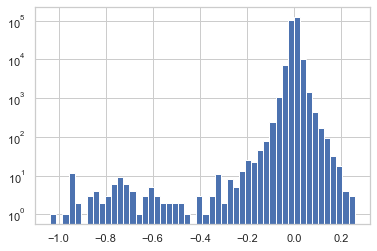

In [190]:
alpha_beta['alpha'].hist(bins=50, log=True)

In [191]:
df.dropna().head()

,,o,h,l,c,v,n,vw,diff,emaS,emaM,...,time_embed_month_sin,time_embed_month_cos,time_embed_year_sin,time_embed_year_cos,market_correlation,market_long_term_trend,market_short_term_trend,market_change,alpha,beta
t,symbol,,,,,,,,,,,,,,,,,,,,,
2018-01-09 17:00:00,BABA,191.480,192.490,190.850,191.340,3198510,21279,191.855,1.006,1.001,1.001,...,0.999,0.035,0.126,0.992,0.925,1.000,1.000,0.250,-0.001,2.613
2018-01-09 18:00:00,BABA,191.335,191.650,190.370,190.690,1701489,11510,190.966,0.995,1.000,1.001,...,1.000,0.026,0.127,0.992,0.924,1.000,1.000,-0.023,-0.005,2.227
2018-01-09 19:00:00,BABA,190.696,190.861,189.780,190.641,1650885,13218,190.282,0.996,1.000,1.000,...,1.000,0.017,0.127,0.992,0.919,1.000,1.000,-0.178,-0.006,1.608
2018-01-09 20:00:00,BABA,190.650,191.220,190.490,190.800,2551084,18238,190.915,1.003,1.000,1.001,...,1.000,0.009,0.128,0.992,0.920,1.000,1.000,-1.315,0.000,1.314
2018-01-09 21:00:00,BABA,190.730,190.850,190.600,190.710,371372,96,190.798,0.999,1.000,1.001,...,1.000,0.000,0.129,0.992,0.921,1.000,1.000,-0.868,-0.001,1.077


In [192]:
df.reset_index().to_csv('final_dataset.csv')

In [193]:
df.groupby('symbol')

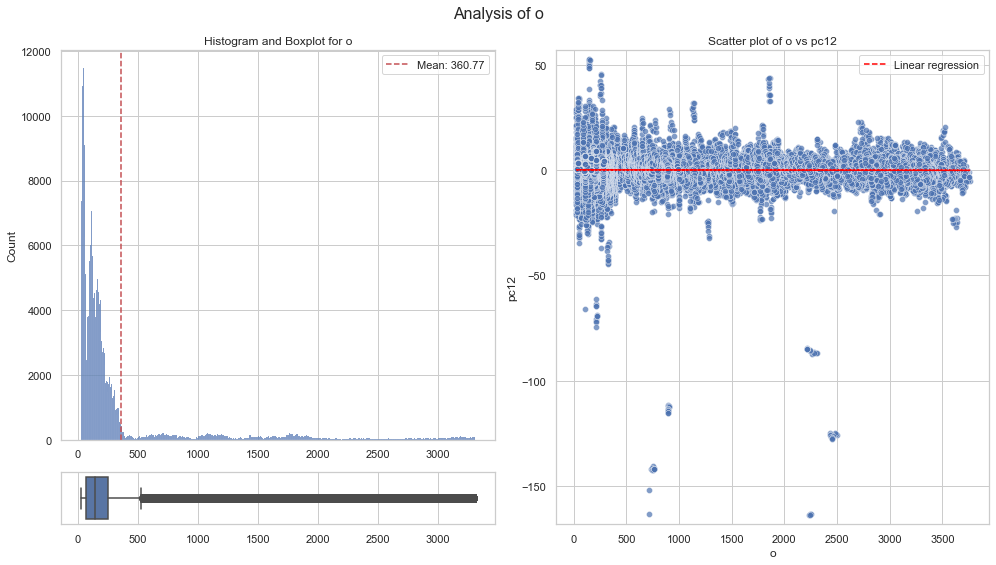

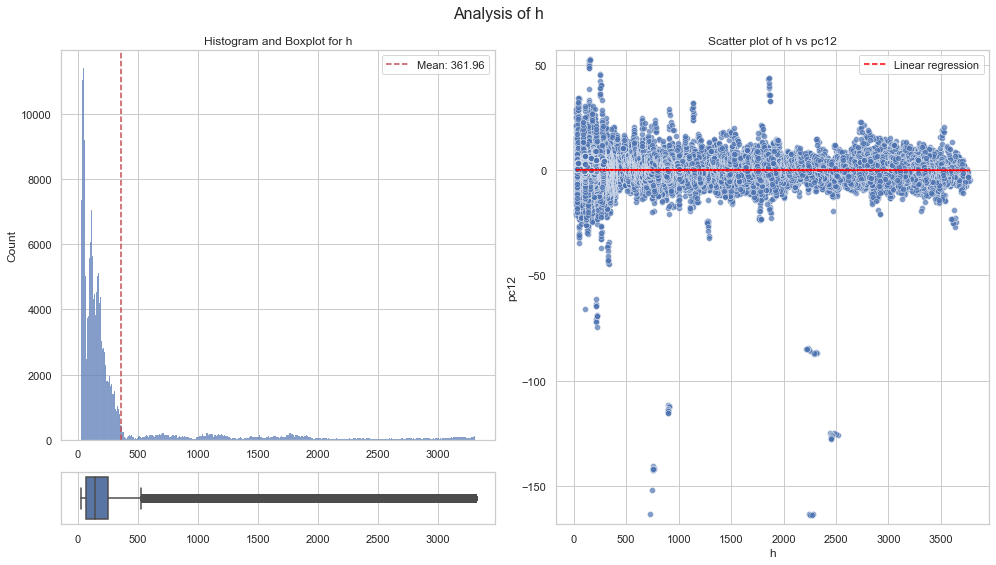

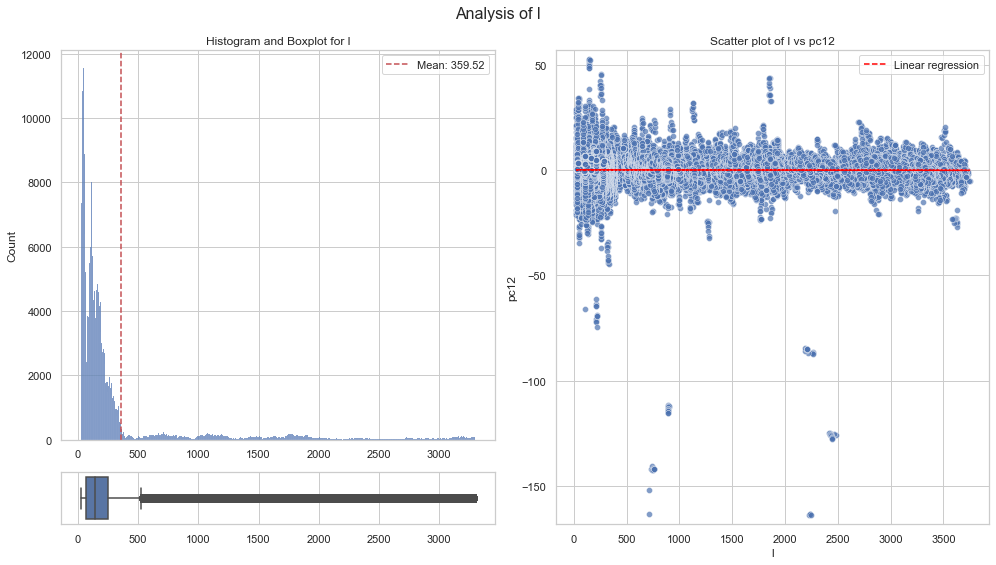

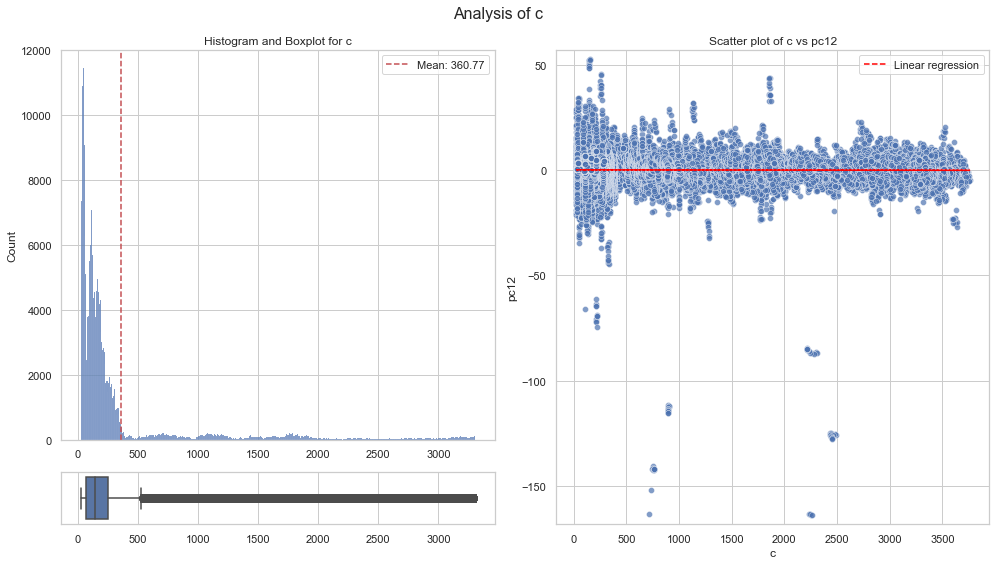

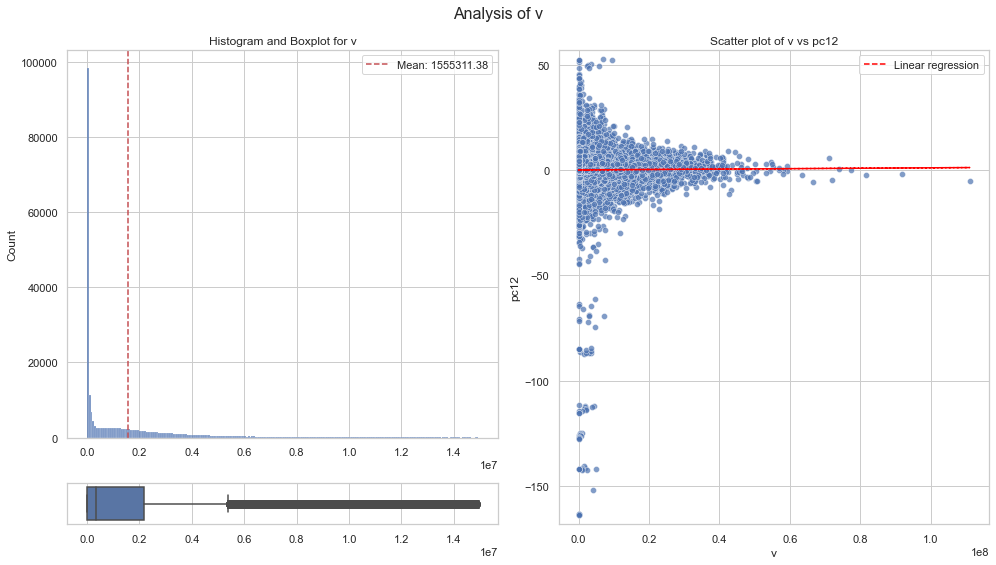

...

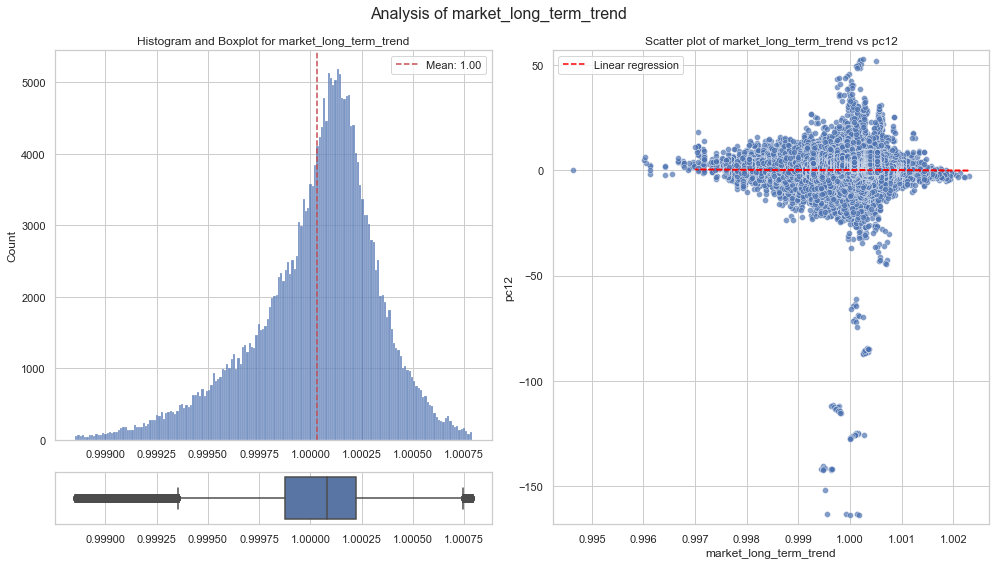

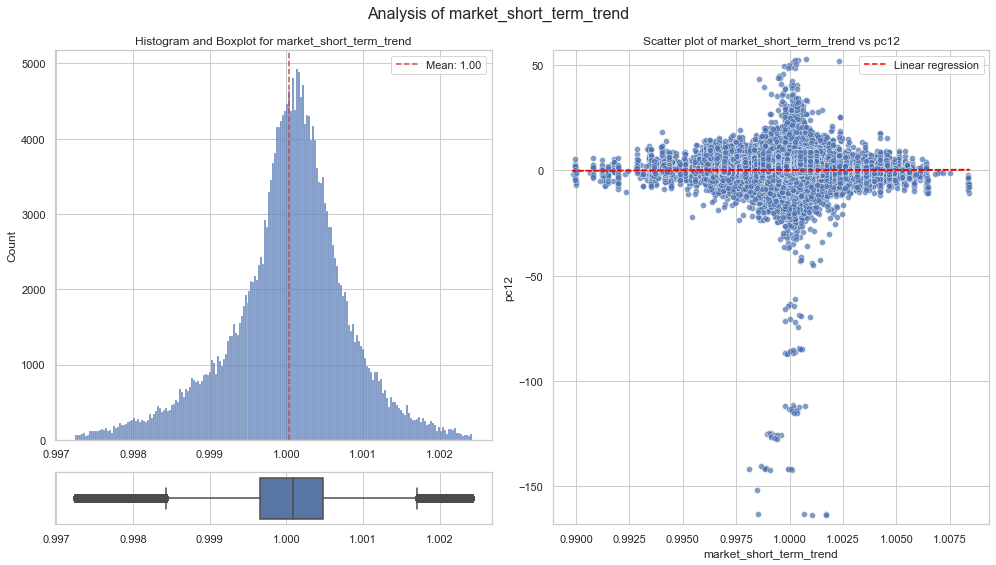

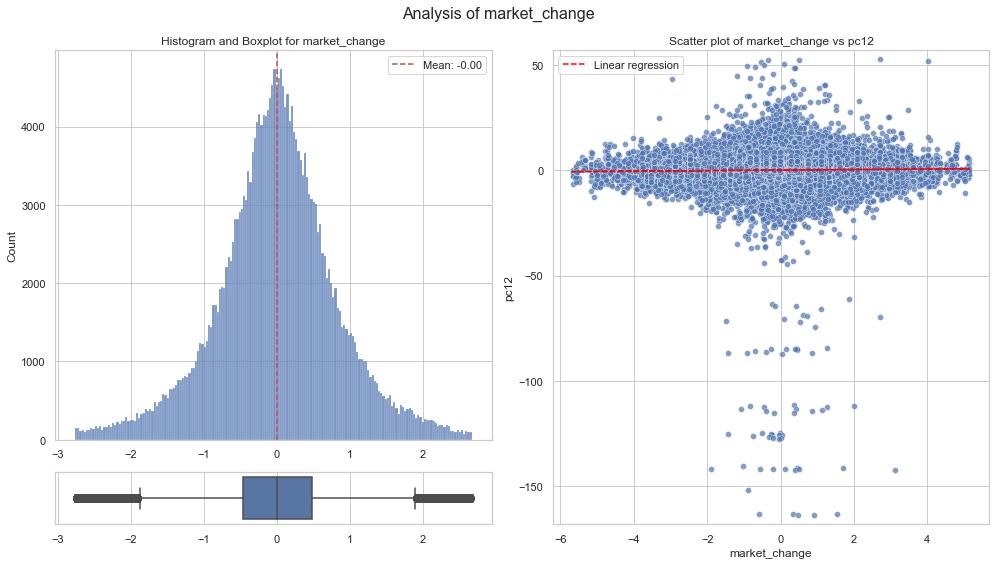

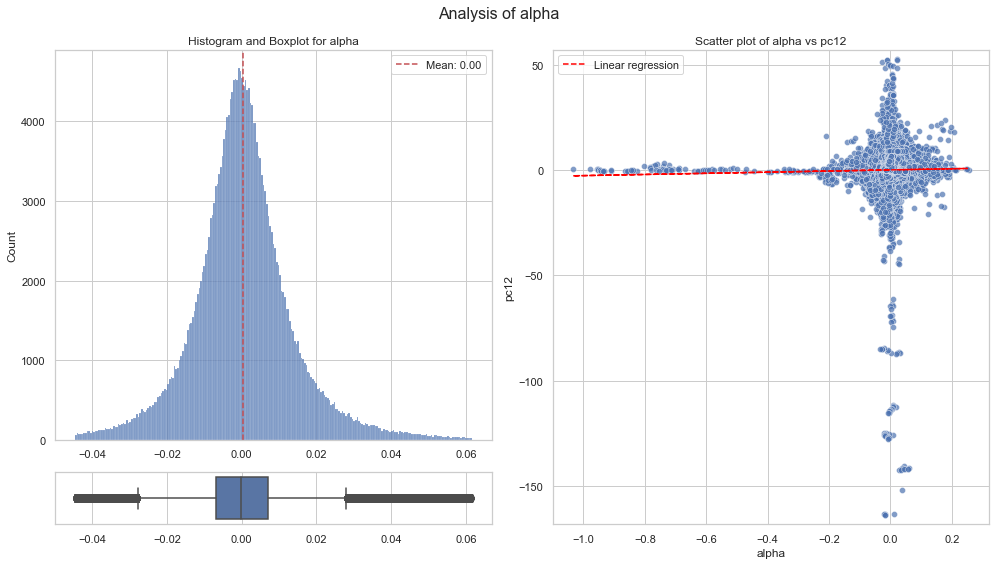

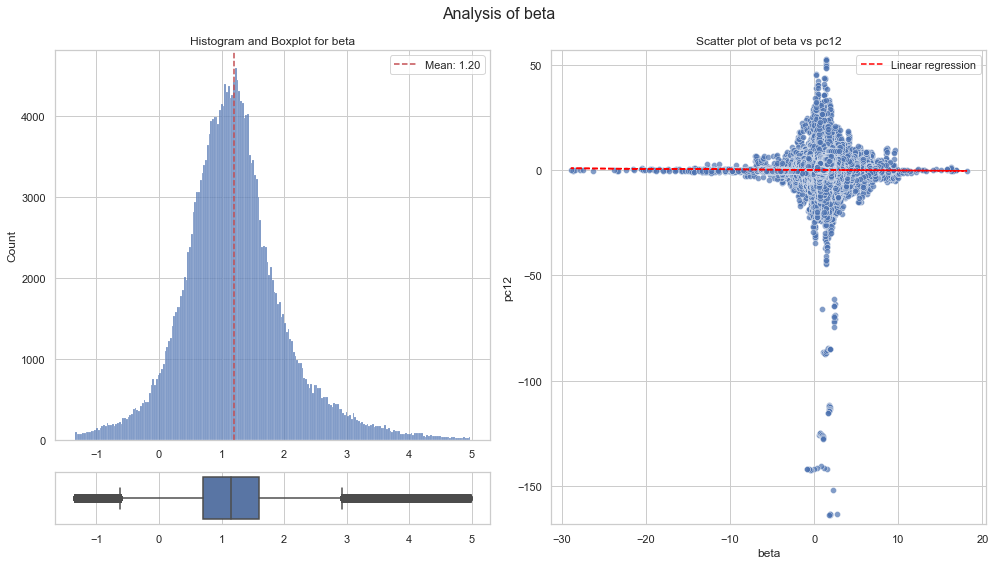

In [194]:
CustomPlotter.combined_plots(
    # df = df.groupby('symbol').get_group('AAPL').reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    df = df.reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    columns = df.columns,
    target = 'pc12',
    outlier_drop_pct=1
)

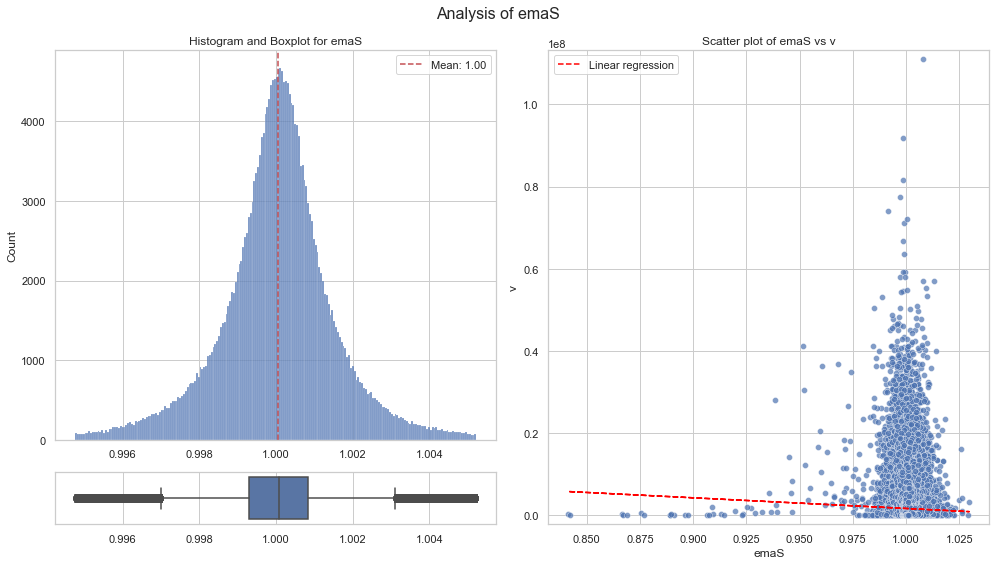

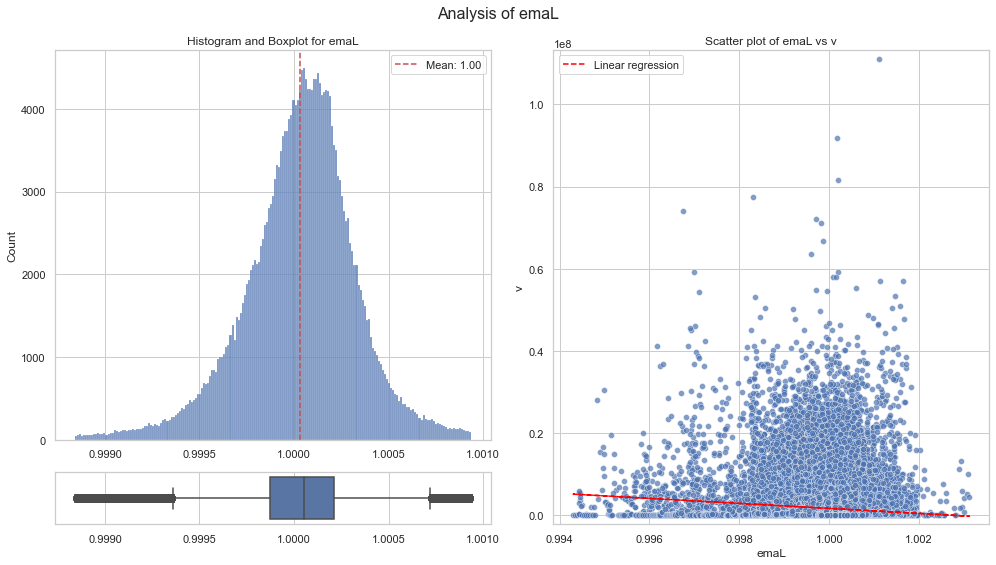

In [99]:
CustomPlotter.combined_plots(
    # df = df.groupby('symbol').get_group('AAPL').reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    df = df.reset_index().sort_values(by='v', ascending=True)[20:].set_index('t').sort_index(),
    columns = ['emaS', 'emaL'],
    target = 'v',
    outlier_drop_pct=1
)

KeyboardInterrupt: 

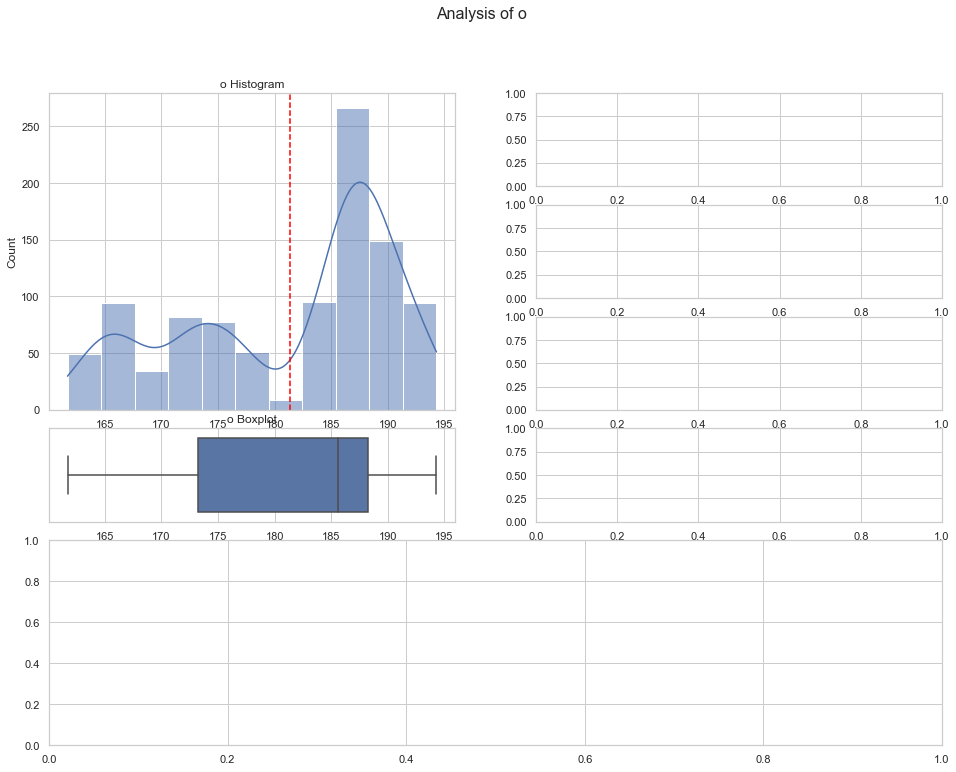

In [197]:
for col in df.columns:
    data = df.groupby('symbol').get_group('AAPL')
    data = data.reset_index()
    data = data.set_index(['t'])

    CustomPlotter.time_series_analysis(data[:1000], col)

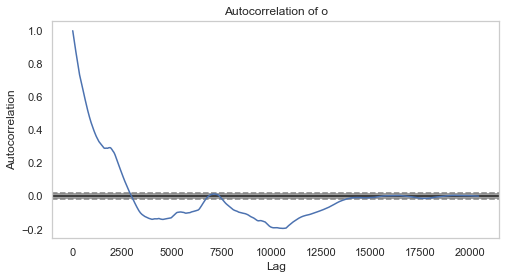

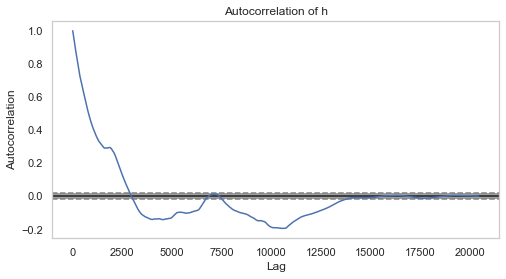

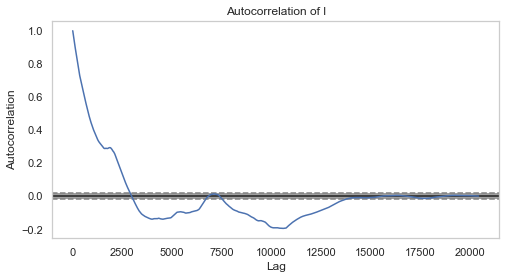

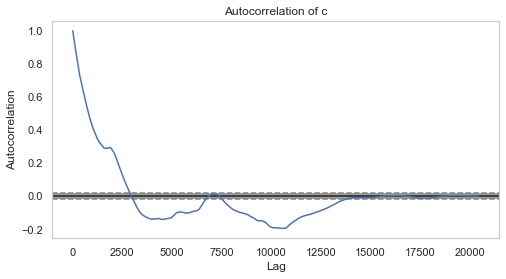

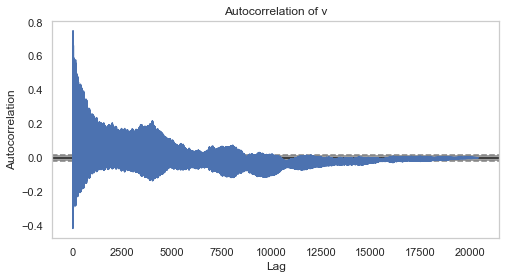

...

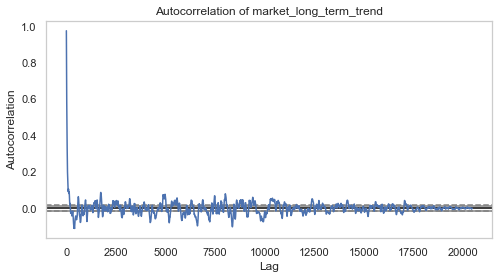

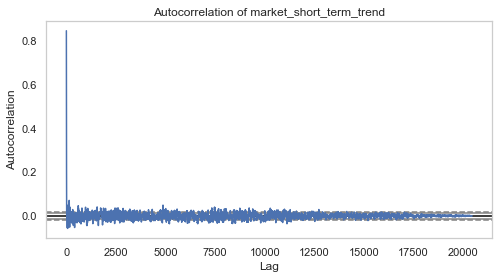

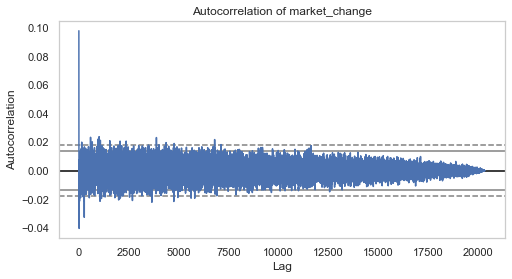

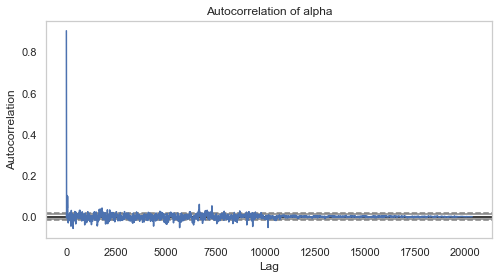

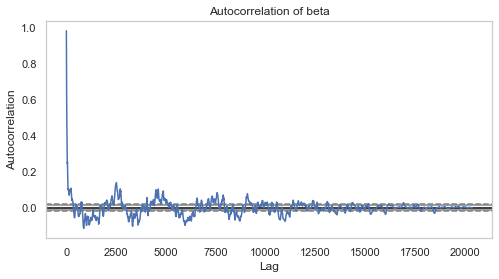

In [198]:
data = df.groupby('symbol').get_group('AAPL').reset_index().set_index(['t']).drop(columns=['symbol'])
CustomPlotter.autocorrelation_analysis(data)

---

In [200]:
data = df.drop(columns=['o', 'h', 'l', 'c', 'v', 'n', 'vw'])

In [201]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [202]:
def print_PCA_analysis(df, target):
    X_numeric = df.select_dtypes(include=[np.number]).drop(columns=target).dropna()
    columns = X_numeric.columns.tolist()

    # Standardize the data
    X_standardized = StandardScaler().fit_transform(X_numeric)

    # Perform PCA
    pca = PCA()
    pca.fit(X_standardized)
    X_pca = pca.transform(X_standardized)

    print("\nExplained variance:")
    for i, var in enumerate(pca.explained_variance_ratio_, 1):
        print("Comp. %d: %.2f%s [%.2f%s]" % (i, var * 100, '%', sum(pca.explained_variance_ratio_[:i]) * 100, '%'))
    #print(pca.explained_variance_ratio_)

    pca_weights = pd.DataFrame(pca.components_, columns=columns, index=[f'Comp. {i+1}' for i in range(pca.n_components_)]).T
    return pca.explained_variance_ratio_, pca_weights

In [203]:
pd.options.display.float_format = "{:,.3f}".format

explained_variance, pca_w = print_PCA_analysis(data, 'pc12')
pca_w


Explained variance:
Comp. 1: 13.48% [13.48%]
Comp. 2: 11.43% [24.91%]
Comp. 3: 8.99% [33.89%]
Comp. 4: 5.98% [39.87%]
Comp. 5: 4.94% [44.81%]
Comp. 6: 3.90% [48.71%]
Comp. 7: 3.36% [52.08%]
Comp. 8: 3.29% [55.37%]
Comp. 9: 2.87% [58.24%]
Comp. 10: 2.83% [61.06%]
Comp. 11: 2.61% [63.67%]
Comp. 12: 2.29% [65.96%]
Comp. 13: 2.21% [68.17%]
Comp. 14: 2.11% [70.28%]
Comp. 15: 1.94% [72.22%]
Comp. 16: 1.82% [74.04%]
Comp. 17: 1.77% [75.81%]
Comp. 18: 1.74% [77.55%]
Comp. 19: 1.70% [79.25%]
Comp. 20: 1.64% [80.89%]
Comp. 21: 1.60% [82.48%]
Comp. 22: 1.51% [84.00%]
Comp. 23: 1.31% [85.30%]
Comp. 24: 1.24% [86.55%]
Comp. 25: 1.21% [87.76%]
Comp. 26: 1.18% [88.93%]
Comp. 27: 1.15% [90.09%]
Comp. 28: 1.04% [91.13%]
Comp. 29: 0.96% [92.09%]
Comp. 30: 0.88% [92.96%]
Comp. 31: 0.81% [93.77%]
Comp. 32: 0.74% [94.51%]
Comp. 33: 0.69% [95.20%]
Comp. 34: 0.65% [95.85%]
Comp. 35: 0.54% [96.39%]
Comp. 36: 0.48% [96.87%]
Comp. 37: 0.43% [97.30%]
Comp. 38: 0.38% [97.68%]
Comp. 39: 0.36% [98.04%]
Comp. 40: 0

,Comp. 1,Comp. 2,Comp. 3,Comp. 4,Comp. 5,Comp. 6,Comp. 7,Comp. 8,Comp. 9,Comp. 10,...,Comp. 49,Comp. 50,Comp. 51,Comp. 52,Comp. 53,Comp. 54,Comp. 55,Comp. 56,Comp. 57,Comp. 58
diff,-0.004,-0.004,-0.208,-0.099,0.220,-0.082,-0.110,0.008,-0.112,0.048,...,0.003,-0.079,-0.001,-0.001,0.002,0.004,-0.000,0.000,0.000,-0.000
emaS,-0.009,-0.007,-0.376,-0.089,0.080,-0.039,-0.015,-0.028,-0.035,-0.123,...,-0.022,0.282,0.005,0.001,-0.002,0.007,0.000,-0.000,0.000,-0.000
emaM,-0.010,-0.006,-0.357,0.029,-0.243,0.045,0.081,-0.017,0.057,0.050,...,0.081,-0.269,-0.004,-0.005,-0.000,0.000,-0.000,0.000,-0.000,0.000
emaL,-0.002,-0.007,-0.262,0.096,-0.286,0.051,0.027,0.030,0.051,0.198,...,-0.085,0.090,0.002,0.021,0.001,-0.000,0.000,-0.000,0.000,0.000
std,0.105,0.106,0.078,-0.293,0.054,0.068,0.162,-0.298,0.053,-0.036,...,-0.112,0.002,0.012,0.001,-0.000,0.000,0.000,0.000,0.000,0.000
pc,-0.003,-0.004,-0.193,-0.114,0.277,-0.083,-0.121,0.015,-0.106,0.086,...,-0.002,0.001,-0.000,0.001,-0.001,-0.003,0.000,0.000,-0.000,0.000
mvS,-0.064,0.234,0.034,-0.251,-0.114,-0.320,0.060,0.114,-0.020,0.096,...,0.075,-0.006,0.136,-0.002,0.000,-0.000,0.194,0.630,0.014,-0.031
mvL,-0.121,0.289,0.016,-0.206,-0.048,0.074,0.036,-0.061,0.142,-0.064,...,-0.014,0.000,-0.171,-0.002,-0.000,0.000,-0.583,0.177,-0.022,0.001
mnS,0.077,0.260,0.032,-0.230,-0.109,-0.296,-0.017,0.066,0.038,0.100,...,-0.034,-0.000,-0.156,0.001,0.000,-0.000,-0.201,-0.656,-0.015,0.032
mnL,0.099,0.314,0.014,-0.183,-0.017,0.090,0.058,-0.054,0.172,-0.082,...,-0.135,0.004,0.208,-0.015,-0.000,0.000,0.647,-0.196,0.024,-0.001


In [204]:
pca_weights_scaled = pca_w * explained_variance
pca_weights_scaled.T.abs().sum().sort_values(ascending=False)

lavs                      0.108
std                       0.106
macd_std                  0.104
Net_Profit_Margin         0.102
beta                      0.097
mvL                       0.097
Current_Ratio             0.097
market_correlation        0.097
Operating_Margin          0.097
ROE                       0.096
Gross_Margin              0.096
mvS                       0.095
rsid                      0.095
mnS                       0.095
Debt_to_Equity            0.094
obvsL                     0.094
diff                      0.094
obvSH                     0.093
FCF                       0.093
spy_value                 0.092
P/S                       0.092
signal                    0.091
market_short_term_trend   0.091
ROA                       0.091
mnL                       0.091
P/E                       0.091
financial_data_age        0.091
macd                      0.090
emaL                      0.088
market_long_term_trend    0.088
obv                       0.087
market_c

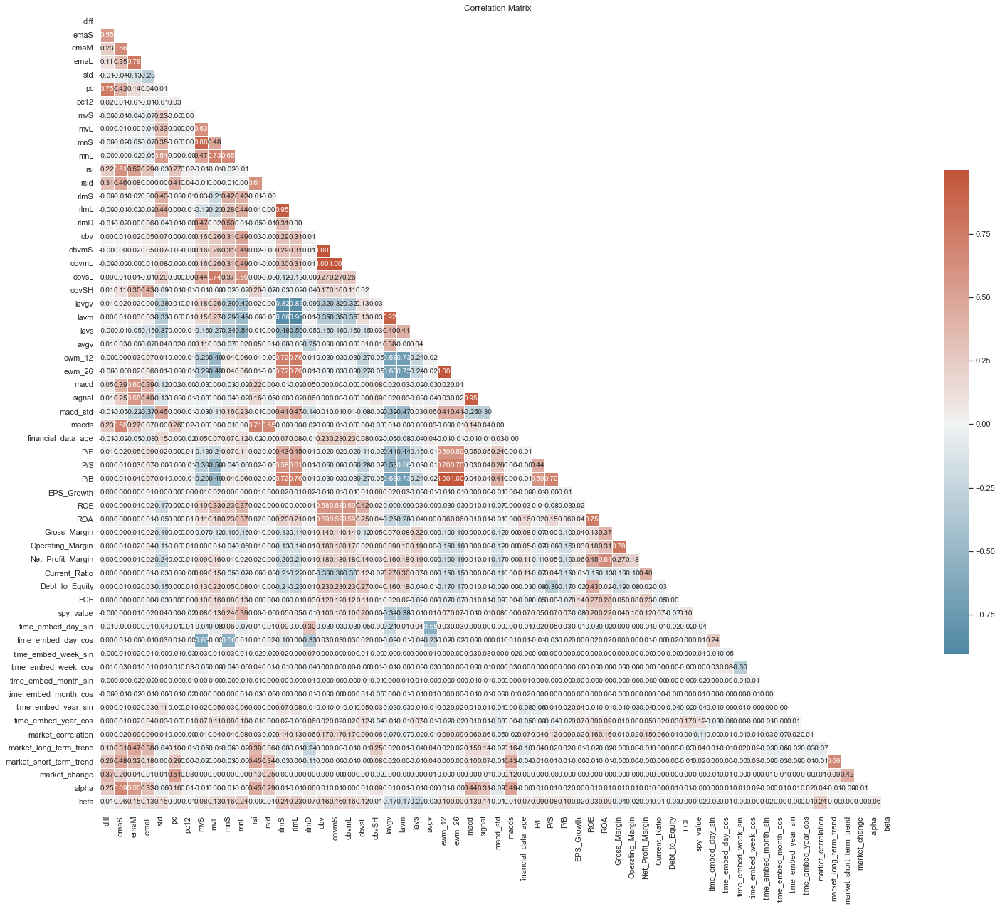

In [290]:
CustomPlotter.plot_corrmatrix(data, figsize=(25, 25))

In [205]:
data.isna().sum()

diff                           0
emaS                           0
emaM                           0
emaL                           0
std                            0
pc                             0
pc12                           0
mvS                            0
mvL                            0
mnS                            0
mnL                            0
rsi                            0
rsid                           0
rlmS                           0
rlmL                           0
rlmD                           0
obv                            0
obvmS                          0
obvmL                          0
obvsL                          0
obvSH                          0
lavgv                          0
lavm                           0
lavs                           0
avgv                           0
ewm_12                         0
ewm_26                         0
macd                           0
signal                         0
macd_std                       0
macds     

In [206]:
def compute_ig(df, target):
    X_numeric = df.select_dtypes(include=[np.number]).drop(columns=target)
    y = df[target]

    mi_scores = mutual_info_regression(X_numeric, y)
    mi_scores = pd.Series(mi_scores, name="MI_Scores", index=X_numeric.columns)
    mi_scores = mi_scores.sort_values(ascending=False)

    print("\nInformation Gain:")
    print(mi_scores)

compute_ig(data.dropna(), 'pc12')


Information Gain:
time_embed_year_sin       0.070
time_embed_year_cos       0.067
financial_data_age        0.053
obvmL                     0.046
obvmS                     0.040
P/E                       0.038
obv                       0.038
macd_std                  0.037
spy_value                 0.037
Net_Profit_Margin         0.036
ROE                       0.035
P/S                       0.034
ROA                       0.034
Gross_Margin              0.034
std                       0.033
ewm_26                    0.033
lavm                      0.032
ewm_12                    0.031
Operating_Margin          0.031
FCF                       0.031
rlmL                      0.030
obvsL                     0.030
P/B                       0.030
Current_Ratio             0.029
Debt_to_Equity            0.028
lavs                      0.021
emaL                      0.020
time_embed_month_sin      0.017
time_embed_month_cos      0.017
EPS_Growth                0.014
market_long_term_tren

---

In [38]:
def get_cluster_dataset(fit_data: pd.DataFrame, target_df: pd.DataFrame, include_price=True):
    
    """
    rows_selection = [
        'financial_data_age', 'obvmL', 'obvmS', 'ema12L', 'P/E', 'obv', 'macd_std', 'spy_value',
        'Net_Profit_Margin', 'ROE', 'ROA', 'P/S', 's', 'std', 'Gross_Margin'
    ]
    if include_price: rows_selection.append('price')
    """

    rows_selection = target_df.columns
    fit_cluster_data = fit_data[rows_selection]
    target_cluster_df = target_df[rows_selection]
    
    num_cols = fit_cluster_data.select_dtypes(include=[np.number]).columns
    cluster_scaler = StandardScaler().fit(fit_cluster_data[num_cols])
    fit_cluster_data[num_cols] = pd.DataFrame(cluster_scaler.transform(fit_cluster_data[num_cols]), columns=num_cols, index=fit_cluster_data.index)
    target_cluster_df[num_cols] = pd.DataFrame(cluster_scaler.transform(target_cluster_df[num_cols]), columns=num_cols, index=target_cluster_df.index)

    return target_cluster_df

In [39]:
def cluster_analysis(data, labels):
    df = pd.DataFrame({'id': labels})

    noise_instances = (df['id'] == -1).sum()
    total_instances = len(data)
    noise_proportion = noise_instances / total_instances

    # Calculate cluster size statistics
    if -1 in df['id'].value_counts():
        cluster_sizes = df['id'].value_counts().drop(-1)  # Remove the noise cluster
    else:
        cluster_sizes = df['id'].value_counts()
    
    mean_cluster_size = cluster_sizes.mean()
    sd_cluster_size = cluster_sizes.std()
    min_cluster_size = cluster_sizes.min()
    max_cluster_size = cluster_sizes.max()

    # Print the results
    print(f"   -> Number of clusters: {len(set(labels))}")
    print(f"   -> Number of noise instances: {noise_instances} [{(noise_proportion*100):.2f}%]")
    print(f"   -> Mean cluster size: {mean_cluster_size:.2f}")
    print(f"   -> Standard deviation of cluster size: {sd_cluster_size:.2f}")
    print(f"   -> Minimum cluster size: {min_cluster_size}")
    print(f"   -> Maximum cluster size: {max_cluster_size}")

In [40]:
from itertools import product

def find_best_clustering(X, min_samples_values, xi_values):
    best_score = -1
    best_params = None
    best_model = None

    # Generate all possible combinations of hyperparameters
    param_combinations = list(product(min_samples_values, xi_values))

    for min_samples, xi in param_combinations:
        print("#"*50)
        print(f"Testing ms: {min_samples} - xi: {xi}")

        # Initialize and fit the OPTICS model with the current combination of hyperparameters
        model = OPTICS(min_samples=min_samples, xi=xi)
        model.fit(X)

        labels = model.labels_
        cluster_analysis(X, labels)

        # Get the indices of the samples in X that have a valid cluster label
        valid_sample_indices = np.where(labels != -1)

        # Extract the samples with valid cluster labels and their corresponding labels
        X_valid = X.iloc[valid_sample_indices]
        labels_valid = labels[valid_sample_indices]

        if len(np.unique(labels_valid)) > 1:
            # Calculate the silhouette score for the current model
            score = silhouette_score(X_valid, labels_valid)

            print(f" -> Silhoulette Score: {score:.2f}")

            # Update the best score, best parameters, and best model if the current score is better
            if score > best_score:
                print(" -> New best score!")
                best_score = score
                best_params = {'min_samples': min_samples, 'xi': xi}
                best_model = model

    return best_score, best_params, best_model

In [41]:
cluster_data = get_cluster_dataset(data, data)
cluster_data.head()

,,diff,emaS,emaM,emaL,ema12L,std,pc,pc12,mvS,mvL,...,Current_Ratio,Debt_to_Equity,FCF,spy_value,market_correlation,market_long_term_trend,market_short_term_trend,market_change,alpha,beta
t,symbol,,,,,,,,,,,,,,,,,,,,,
2018-01-02 09:00:00,BABA,0.714,0.393,0.050,-0.190,0.282,-0.375,1.327,3.200,-0.791,-0.177,...,-0.354,-0.397,2.004,-1.333,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02 10:00:00,BABA,0.346,0.509,0.122,-0.153,0.352,-0.379,0.653,3.144,-0.990,-0.197,...,-0.354,-0.397,2.004,-1.332,1.105,0.057,0.020,NaN,NaN,NaN
2018-01-02 11:00:00,BABA,0.368,0.617,0.197,-0.113,0.419,-0.383,0.690,3.059,-1.124,-0.214,...,-0.354,-0.397,2.004,-1.329,0.841,1.330,0.541,0.753,NaN,NaN
2018-01-02 12:00:00,BABA,0.210,0.625,0.237,-0.091,0.485,-0.388,0.399,3.020,-1.026,-0.218,...,-0.354,-0.397,2.004,-1.325,0.938,1.622,0.655,0.455,NaN,NaN
2018-01-02 13:00:00,BABA,0.271,0.663,0.289,-0.062,0.550,-0.393,0.510,3.005,-0.890,-0.219,...,-0.354,-0.397,2.004,-1.323,1.012,1.653,0.657,0.101,NaN,NaN


In [135]:
# Define the range of hyperparameter values to search through
min_samples_values = [5, 25, 50, 100, 200, 500]
xi_values = [0.000001]

# Find the best clustering model
best_score, best_params, best_model = find_best_clustering(
    cluster_data[cluster_data.index.get_level_values('symbol') == 'AAPL'].dropna(),
    [5, 25, 50, 100, 200, 500],
    [0.0000001]
)

print(f"Best Silhouette Score: {best_score}")
print(f"Best Parameters: {best_params}")

##################################################
Testing ms: 5 - xi: 1e-07
   -> Number of clusters: 992
   -> Number of noise instances: 11555 [4.54%]
   -> Mean cluster size: 7.88
   -> Standard deviation of cluster size: 3.43
   -> Minimum cluster size: 5
   -> Maximum cluster size: 27
 -> Silhoulette Score: 0.28
 -> New best score!
##################################################
Testing ms: 25 - xi: 1e-07
   -> Number of clusters: 64
   -> Number of noise instances: 15321 [6.03%]
   -> Mean cluster size: 64.21
   -> Standard deviation of cluster size: 77.02
   -> Minimum cluster size: 26
   -> Maximum cluster size: 583
 -> Silhoulette Score: 0.20
##################################################
Testing ms: 50 - xi: 1e-07
   -> Number of clusters: 25
   -> Number of noise instances: 12401 [4.88%]
   -> Mean cluster size: 290.21
   -> Standard deviation of cluster size: 396.54
   -> Minimum cluster size: 51
   -> Maximum cluster size: 1517
 -> Silhoulette Score: 0.15
#########

In [100]:
best_score, best_params, best_model = find_best_clustering(
    cluster_data.sample(int(len(cluster_data) * 0.10)).dropna(),
    [50],
    [0.0000001]
)

##################################################
Testing ms: 50 - xi: 1e-07
   -> Number of clusters: 30
   -> Number of noise instances: 16212 [75.99%]
   -> Mean cluster size: 176.62
   -> Standard deviation of cluster size: 174.10
   -> Minimum cluster size: 50
   -> Maximum cluster size: 614
 -> Silhoulette Score: 0.22
 -> New best score!


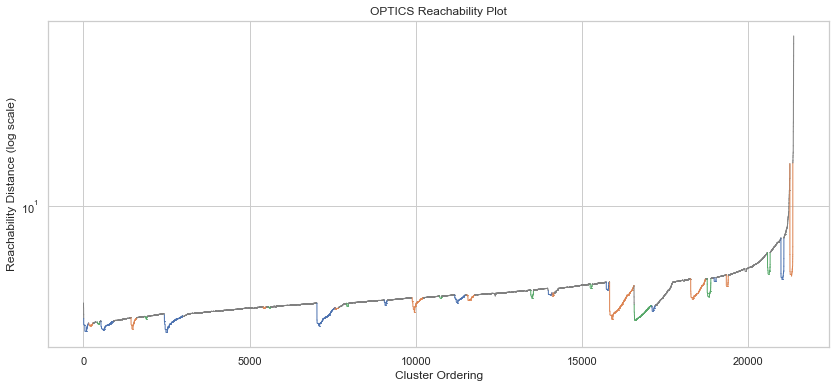

In [44]:
# Extract reachability distances, cluster ordering, and labels
reachability = best_model.reachability_[best_model.ordering_]
cluster_ordering = np.arange(len(reachability))
labels = best_model.labels_[best_model.ordering_]

# Assign colors based on cluster labels
colors = np.where(labels == -1, 'gray', None)
unique_clusters = np.unique(labels[labels != -1])

for i, cluster in enumerate(unique_clusters):
    colors[labels == cluster] = ['C0', 'C1', 'C2'][i % 3]

sn.set_style('whitegrid')

# Create the plot
fig, ax = plt.subplots(figsize=(14, 6))

# Plot each segment of the line with its corresponding color
for i in range(1, len(reachability)):
    ax.plot(cluster_ordering[i-1:i+1], reachability[i-1:i+1], lw=1, color=colors[i-1])

# Set the y-axis to logarithmic scale
ax.set_yscale('log')

plt.title('OPTICS Reachability Plot')
plt.xlabel('Cluster Ordering')
plt.ylabel('Reachability Distance (log scale)')

plt.show()


---

In [207]:
data.columns

Index(['diff', 'emaS', 'emaM', 'emaL', 'std', 'pc', 'pc12', 'mvS', 'mvL',
       'mnS', 'mnL', 'rsi', 'rsid', 'rlmS', 'rlmL', 'rlmD', 'obv', 'obvmS',
       'obvmL', 'obvsL', 'obvSH', 'lavgv', 'lavm', 'lavs', 'avgv', 'ewm_12',
       'ewm_26', 'macd', 'signal', 'macd_std', 'macds', 'financial_data_age',
       'P/E', 'P/S', 'P/B', 'EPS_Growth', 'ROE', 'ROA', 'Gross_Margin',
       'Operating_Margin', 'Net_Profit_Margin', 'Current_Ratio',
       'Debt_to_Equity', 'FCF', 'spy_value', 'time_embed_day_sin',
       'time_embed_day_cos', 'time_embed_week_sin', 'time_embed_week_cos',
       'time_embed_month_sin', 'time_embed_month_cos', 'time_embed_year_sin',
       'time_embed_year_cos', 'market_correlation', 'market_long_term_trend',
       'market_short_term_trend', 'market_change', 'alpha', 'beta'],
      dtype='object')

In [208]:
data.index.get_level_values('t').min()
data.index.get_level_values('t').max()

timestamps = data.index.get_level_values('t')
min_timestamp = timestamps.min()
max_timestamp = timestamps.max()

# Find the timestamp that is 80% of the way between the min and max
threshold_timestamp = min_timestamp + 0.8 * (max_timestamp - min_timestamp)
print("80% division timestamp:", threshold_timestamp)


80% division timestamp: 2022-03-14 01:00:00


In [209]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import catboost as cat

# Split the data
X = data.drop('pc12', axis=1)
y = data['pc12']
X_train = X[X.index.get_level_values('t') <= threshold_timestamp]
X_test = X[X.index.get_level_values('t') > threshold_timestamp]
y_train = y[X.index.get_level_values('t') <= threshold_timestamp]
y_test = y[X.index.get_level_values('t') > threshold_timestamp]

# Apply Standard Scaler
labels_scaler = StandardScaler()
X_train_scaled = labels_scaler.fit_transform(X_train)
X_test_scaled = labels_scaler.transform(X_test)

targets_scaler = StandardScaler()
y_train_scaled = targets_scaler.fit_transform(y_train.to_numpy().reshape(-1, 1))
y_test_scaled = targets_scaler.transform(y_test.to_numpy().reshape(-1, 1))

print(X_train_scaled.shape)
print(X_test_scaled.shape)
print(y_train_scaled.shape)
print(y_test_scaled.shape)

(195740, 58)
(58525, 58)
(195740, 1)
(58525, 1)


In [145]:
cat.cv(
    cat.Pool(X_train_scaled, y_train_scaled),
    {
        'learning_rate': 0.5,
        'iterations': 40000,
        'loss_function': 'RMSE',
        'early_stopping_rounds': 100,
    },
    fold_count=5,
    plot=True,
    verbose=2000
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/5]
0:	learn: 0.9767044	test: 0.9585303	best: 0.9585303 (0)	total: 14.8ms	remaining: 9m 51s


KeyboardInterrupt: 

[0]	validation_0-rmse:1.45019
[99]	validation_0-rmse:7.13654


<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

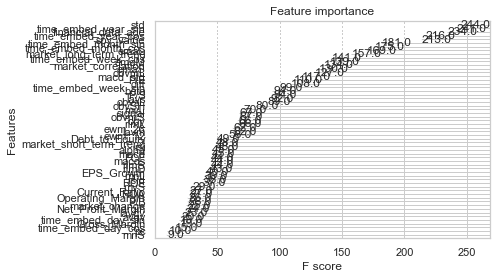

In [285]:
# Initialize the model
model = xgb.XGBRegressor(
    **{
        'learning_rate': 0.1,
        'max_depth': 6,
        'n_estimators': 1500,
        'early_stopping_rounds': 100
    }
)

# Train the model
model.fit(
    pd.DataFrame(X_train_scaled, columns=X.columns),
    y_train_scaled,
    eval_set=[(pd.DataFrame(X_test_scaled, columns=X.columns), y_test_scaled)], 
    verbose=1000
)

# Visualize feature importance
xgb.plot_importance(model)

In [210]:
# Train CatBoost Regressor with fancy visuals
model = cat.CatBoostRegressor(
    iterations=40000,
    learning_rate=0.1,
    # early_stopping_rounds=1000,
    loss_function='RMSE',
    verbose=1000
)

model.fit(
    cat.Pool(X_train_scaled, y_train_scaled),
    eval_set=cat.Pool(X_test_scaled, y_test_scaled),
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9925287	test: 1.1539221	best: 1.1539221 (0)	total: 22.6ms	remaining: 15m 4s
1000:	learn: 0.6033123	test: 1.3302380	best: 1.1539221 (0)	total: 15.2s	remaining: 9m 52s
2000:	learn: 0.4931030	test: 1.3531821	best: 1.1539221 (0)	total: 30.7s	remaining: 9m 42s
3000:	learn: 0.4227563	test: 1.3786538	best: 1.1539221 (0)	total: 46.7s	remaining: 9m 35s
4000:	learn: 0.3730404	test: 1.3967519	best: 1.1539221 (0)	total: 1m 3s	remaining: 9m 34s
5000:	learn: 0.3351254	test: 1.4052992	best: 1.1539221 (0)	total: 1m 21s	remaining: 9m 29s
6000:	learn: 0.3051839	test: 1.4102673	best: 1.1539221 (0)	total: 1m 39s	remaining: 9m 21s
7000:	learn: 0.2811345	test: 1.4151011	best: 1.1539221 (0)	total: 1m 59s	remaining: 9m 23s
8000:	learn: 0.2613594	test: 1.4187438	best: 1.1539221 (0)	total: 2m 19s	remaining: 9m 17s
9000:	learn: 0.2442292	test: 1.4229077	best: 1.1539221 (0)	total: 2m 40s	remaining: 9m 12s
10000:	learn: 0.2293756	test: 1.4258061	best: 1.1539221 (0)	total: 3m	remaining: 9m 1s
11000:	lea

KeyboardInterrupt: 

In [286]:
# Evaluate using MSE
y_pred_train = model.predict(X_train_scaled)
y_pred_test = model.predict(X_test_scaled)
mse_train = mean_squared_error(y_train_scaled, y_pred_train)
mse_test = mean_squared_error(y_test_scaled, y_pred_test)
print(f'Train MSE: {mse_train:.2f}')
print(f'Test MSE: {mse_test:.2f}')

# Predict the test dataset
test_predictions = targets_scaler.inverse_transform(model.predict(X_test_scaled).reshape(-1, 1))
test_targets = y_test.to_numpy()

train_predictions = targets_scaler.inverse_transform(model.predict(X_train_scaled).reshape(-1, 1))
train_targets = y_train.to_numpy()

Train MSE: 1.18
Test MSE: 2.10


In [288]:
pd.options.display.float_format = "{:,.3f}".format

def plot_predictions(train_predictions, train_targets, test_predictions, test_targets):
    plt.figure(figsize=(12, 6))
    sn.set_style("whitegrid")

    plt.scatter(train_targets.flatten(), train_predictions.flatten(), alpha=0.5, label="Train")
    plt.scatter(test_targets.flatten(), test_predictions.flatten(), alpha=0.5, label="Test")

    targets = np.concatenate((train_targets, test_targets)).flatten()
    predictions = np.concatenate((train_predictions, test_predictions)).flatten()

    lin_reg = LinearRegression()
    lin_reg.fit(targets.reshape(-1, 1), predictions.reshape(-1, 1))
    y_pred_reg = lin_reg.predict(targets.reshape(-1, 1))

    plt.plot(targets, y_pred_reg, color='red', linestyle='--', label='Linear regression')

    plt.xlabel('Expected Value')
    plt.ylabel('Predicted Value')
    plt.title('Scatter Plot of Expected Value vs Predicted Value')
    
    # plt.xlim((-50, 50))
    # plt.ylim((0, 5))
    
    plt.legend()
    plt.show()

def print_metrics(train_predictions, train_targets, test_predictions, test_targets):
    results = {}

    for name, pred, targ in zip(
        ["Train", "Test"],
        [train_predictions, test_predictions],
        [train_targets, test_targets],
    ):
        results[name] = {
            "r2": r2_score(targ.flatten(), pred.flatten()),
            "rmse": np.sqrt(mean_squared_error(targ.flatten(), pred.flatten())),
            "mae": mean_absolute_error(targ.flatten(), pred.flatten()),
            "mse": mean_squared_error(targ.flatten(), pred.flatten()),
        }

    return pd.DataFrame(results)

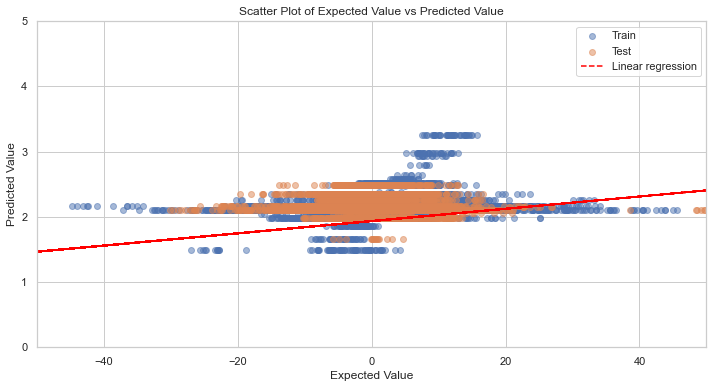

,Train,Test
r2,-0.178,-0.581
rmse,4.828,6.449
mae,3.372,3.997
mse,23.305,41.593


In [289]:
plot_predictions(
    train_predictions, train_targets,
    test_predictions, test_targets,
)
print_metrics(
    train_predictions, train_targets,
    test_predictions, test_targets,
)

In [161]:
pd.qcut(test_targets, 15, labels=False)

array([ 0,  0,  1, ..., 12, 14,  7])

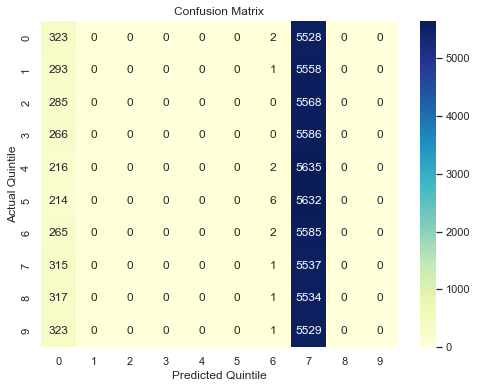

In [163]:
from sklearn.metrics import confusion_matrix

N = 10
target_quintiles = pd.qcut(test_targets, N, labels=False)

# Divide prediction values into the same N quintiles based on target value ranges
prediction_quintiles = np.zeros(test_predictions.shape, dtype=int)
for i in range(N):
    if i == 0:
        upper_bound = test_targets[target_quintiles == i].max()
        mask = test_predictions < upper_bound
    elif i == (N-1):
        upper_bound = test_targets[target_quintiles == i].max()
        lower_bound = test_targets[target_quintiles == i].min()
        mask = (test_predictions >= lower_bound) & (test_predictions < upper_bound)
    else:
        upper_bound = test_targets[target_quintiles == i].max()
        lower_bound = test_targets[target_quintiles == i].min()
        mask = test_predictions >= lower_bound

    prediction_quintiles[mask] = i

# Calculate confusion matrix
cm = confusion_matrix(target_quintiles, prediction_quintiles)

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
sn.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
ax.set_xlabel("Predicted Quintile")
ax.set_ylabel("Actual Quintile")
ax.set_title("Confusion Matrix")
plt.show()

---

In [280]:
def fit_targets_classes(targets):
    return pd.qcut(targets, 5, labels=False)

def predict_targets_classes(fitted_categories: pd.DataFrame, fitted_targets, predict_targets):
    fitted_classes = fitted_categories
    predict_quintiles = np.zeros(predict_targets.shape, dtype=int)

    for i in range(N):
        if i == 0:
            upper_bound = fitted_targets[fitted_classes == i].max()
            mask = predict_targets < upper_bound
        elif i == (N-1):
            upper_bound = fitted_targets[fitted_classes == i].max()
            lower_bound = fitted_targets[fitted_classes == i].min()
            mask = (predict_targets >= lower_bound) & (predict_targets < upper_bound)
        else:
            upper_bound = fitted_targets[fitted_classes == i].max()
            lower_bound = fitted_targets[fitted_classes == i].min()
            mask = predict_targets >= lower_bound

        predict_quintiles[mask] = i

    return (pd.DataFrame(predict_quintiles).astype('category'))

In [281]:
train_classification = fit_targets_classes(y_train)
test_classification = predict_targets_classes(train_classification, pd.DataFrame(y_train), pd.DataFrame(y_test))

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

train_encoded = le.fit_transform(train_classification)
test_encoded = le.transform(test_classification)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [283]:
len(np.unique(train_encoded))

5

In [211]:
data.columns

Index(['diff', 'emaS', 'emaM', 'emaL', 'std', 'pc', 'pc12', 'mvS', 'mvL',
       'mnS', 'mnL', 'rsi', 'rsid', 'rlmS', 'rlmL', 'rlmD', 'obv', 'obvmS',
       'obvmL', 'obvsL', 'obvSH', 'lavgv', 'lavm', 'lavs', 'avgv', 'ewm_12',
       'ewm_26', 'macd', 'signal', 'macd_std', 'macds', 'financial_data_age',
       'P/E', 'P/S', 'P/B', 'EPS_Growth', 'ROE', 'ROA', 'Gross_Margin',
       'Operating_Margin', 'Net_Profit_Margin', 'Current_Ratio',
       'Debt_to_Equity', 'FCF', 'spy_value', 'time_embed_day_sin',
       'time_embed_day_cos', 'time_embed_week_sin', 'time_embed_week_cos',
       'time_embed_month_sin', 'time_embed_month_cos', 'time_embed_year_sin',
       'time_embed_year_cos', 'market_correlation', 'market_long_term_trend',
       'market_short_term_trend', 'market_change', 'alpha', 'beta'],
      dtype='object')

In [221]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [240]:
model = Sequential([
    Dense(2048, activation='relu', input_shape=(X_train.shape[1],)),
    # Dropout(0.4),
    Dense(2048, activation='relu'),
    # Dropout(0.3),
    Dense(2048, activation='relu'),
    # Dropout(0.3),
    Dense(64, activation='relu'),
    # Dropout(0.2),
    Dense(5, activation='softmax')
])
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_27 (Dense)             (None, 2048)              120832    
_________________________________________________________________
dense_28 (Dense)             (None, 2048)              4196352   
_________________________________________________________________
dense_29 (Dense)             (None, 2048)              4196352   
_________________________________________________________________
dense_30 (Dense)             (None, 64)                131136    
_________________________________________________________________
dense_31 (Dense)             (None, 5)                 325       
Total params: 8,644,997
Trainable params: 8,644,997
Non-trainable params: 0
_________________________________________________________________


In [241]:
history = model.fit(
    X_train_scaled,
    train_classification,
    epochs=100,
    batch_size=256,
    validation_split=0.2,
    callbacks=[
        EarlyStopping(patience=10, restore_best_weights=True)
    ]
)

Epoch 1/100
  1/612 [..............................] - ETA: 3:09 - loss: 1.6152 - accuracy: 0.1914

2023-04-22 18:53:49.707742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


612/612 [==============================] - ETA: 0s - loss: 1.6094 - accuracy: 0.2005

2023-04-22 18:54:03.239702: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


612/612 [==============================] - 15s 25ms/step - loss: 1.6094 - accuracy: 0.2005 - val_loss: 1.6098 - val_accuracy: 0.1926
Epoch 2/100
612/612 [==============================] - 15s 24ms/step - loss: 1.6094 - accuracy: 0.2002 - val_loss: 1.6096 - val_accuracy: 0.1926
Epoch 3/100
612/612 [==============================] - 15s 25ms/step - loss: 1.6094 - accuracy: 0.2017 - val_loss: 1.6099 - val_accuracy: 0.1926
Epoch 4/100
612/612 [==============================] - 16s 26ms/step - loss: 1.6094 - accuracy: 0.2017 - val_loss: 1.6097 - val_accuracy: 0.1938
Epoch 5/100
612/612 [==============================] - 16s 26ms/step - loss: 1.6094 - accuracy: 0.2011 - val_loss: 1.6097 - val_accuracy: 0.1938
Epoch 6/100
612/612 [==============================] - 16s 26ms/step - loss: 1.6094 - accuracy: 0.2016 - val_loss: 1.6098 - val_accuracy: 0.1938
Epoch 7/100
612/612 [==============================] - 16s 26ms/step - loss: 1.6094 - accuracy: 0.2002 - val_loss: 1.6098 - val_accuracy: 0.19

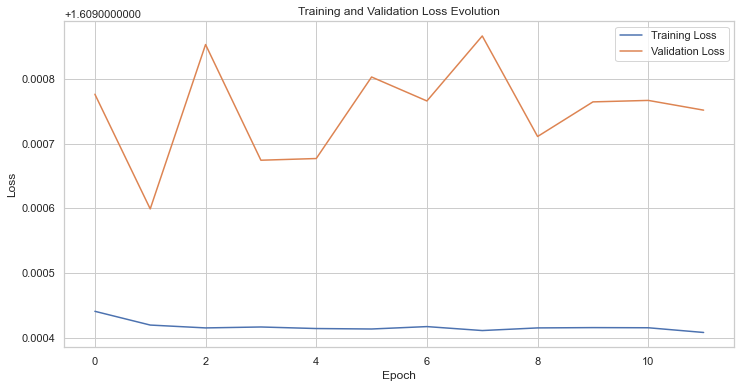

In [242]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the training and validation loss
plt.figure(figsize=(12, 6))
sn.lineplot(x=range(len(train_loss)), y=train_loss, label='Training Loss')
sn.lineplot(x=range(len(val_loss)), y=val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Evolution')
plt.legend()
plt.show()

In [ ]:
eval_results = model.evaluate(X_test, y_test, verbose=1)
print(f"Test loss: {eval_results[0]}, Test MSE: {eval_results[1]}")

# Make predictions
predictions = model.predict(X_test)

In [291]:
columns = [
    'pc', 'emaL', 'emaS', 'mvS', 'rsi', 'macds', 'lavs', 'Net_Profit_Margin', 'market_correlation',
    'Gross_Margin', 'P/E', 'time_embed_year_sin', 'time_embed_year_cos', 'financial_data_age', 'obvmL'
]
len(columns)

15

In [293]:
model = cat.CatBoostClassifier(
    iterations=40000,
    learning_rate=0.1,
    # early_stopping_rounds=1000,
    loss_function='MultiClass',
    classes_count=5,
    verbose=1000
)

model.fit(
    cat.Pool(pd.DataFrame(X_train_scaled, columns=X.columns)[columns], train_encoded),
    eval_set=cat.Pool(pd.DataFrame(X_test_scaled, columns=X.columns)[columns], test_encoded),
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.6073223	test: 1.6094744	best: 1.6094744 (0)	total: 63.2ms	remaining: 42m 8s
1000:	learn: 1.3187665	test: 1.7154639	best: 1.6071083 (17)	total: 36s	remaining: 23m 21s


KeyboardInterrupt: 

---

In [128]:
import shap
shap.initjs()

In [129]:
cat_data = pd.DataFrame(X_train_scaled, columns=data.drop(columns=['pc12']).columns)
explainer_cat = shap.TreeExplainer(model)
explainer_cat

In [130]:
shap_values_cat = explainer_cat.shap_values(cat_data)

In [131]:
shap.force_plot(explainer_cat.expected_value, shap_values_cat[0,:], cat_data.iloc[0,:])

In [132]:
shap.force_plot(explainer_cat.expected_value, shap_values_cat[0:1000], cat_data[0:1000])